### In this notebook we try to create a baseline model using player statistics in every match to predict the scoreline of a match. We observed the some stastics are directed related to goals by the players so we need to change the approach for training the model. Feel free to skim through the notebook for some EDA and training/testing code. We will reuse some of the code in the next experimentation notebook. 

In [8]:
import pandas as pd

In [1]:
# first we load train set match IDs from did and match_list from pickle files
import pickle
with open('train_set.pkl', 'rb') as f:
    train_set = pickle.load(f)

In [24]:
train_set['Arsenal_Wolves_1_20240817_H']

{'team1': 'Arsenal',
 'team2': 'Wolves',
 'date': '20240817',
 'round': '1',
 'homeaway': 'H',
 'team1_players': [{'player_name': 'Ben White',
   'stats_path': '../../../MusicRecMix/tracks/tracksharepoint/National University of Singapore/Sandesh Sreepathy Upadhyaya - Football Dataset/2425_NEW/Arsenal/Ben White/summary.json'},
  {'player_name': 'Bukayo Saka',
   'stats_path': '../../../MusicRecMix/tracks/tracksharepoint/National University of Singapore/Sandesh Sreepathy Upadhyaya - Football Dataset/2425_NEW/Arsenal/Bukayo Saka/summary.json'},
  {'player_name': 'David Raya',
   'stats_path': '../../../MusicRecMix/tracks/tracksharepoint/National University of Singapore/Sandesh Sreepathy Upadhyaya - Football Dataset/2425_NEW/Arsenal/David Raya/summary.json'},
  {'player_name': 'Declan Rice',
   'stats_path': '../../../MusicRecMix/tracks/tracksharepoint/National University of Singapore/Sandesh Sreepathy Upadhyaya - Football Dataset/2425_NEW/Arsenal/Declan Rice/summary.json'},
  {'player_nam

In [ ]:
idx = 'Arsenal_Wolves_1_20240817_H'
xd = pd.read_json(train_set['Arsenal_Wolves_1_20240817_H']['team1_players'][0]['stats_path'])
xd[xd.apply(lambda row: f"{row['Squad']}_{row['Opponent']}_{row['Round'].split(' ')[1]}_{str(row['Date'].date()).replace('-', '')}_{row['Venue'][0]}" == idx, axis=1)]

,Date,Day,Comp,Round,Venue,Result,Squad,Opponent,Start,Pos,...,SCA,GCA,Cmp,Att,Cmp%,PrgP,Carries,PrgC,Succ,Match Report
0,2024-08-17,Sat,Premier League,Matchweek 1,Home,W 2–0,Arsenal,Wolves,Y,RB,...,3,0,38,1,82.6,6,33,0,0,Match Report


In [ ]:
xd[['Start', 'Pos', 'Min', 'Gls', 'Ast', 'PK', 'PKatt', 'Sh', 'SoT', 'CrdY',
       'CrdR', 'Touches', 'Tkl', 'Int', 'Blocks', 'xG', 'npxG', 'xAG', 'SCA',
       'GCA', 'Cmp', 'Att', 'Cmp%', 'PrgP', 'Carries', 'PrgC']]

,Start,Pos,Min,Gls,Ast,PK,PKatt,Sh,SoT,CrdY,...,xAG,SCA,GCA,Cmp,Att,Cmp%,PrgP,Carries,PrgC,Succ
0,Y,RB,90,0,0,0,0,2,1,0,...,0.0,3,0,38,1,82.6,6,33,0,0
1,Y,RB,90,0,0,0,0,0,0,0,...,0.0,0,0,61,0,91.0,8,45,1,0
2,Y,"RB,CB",90,0,0,0,0,1,0,0,...,0.0,1,0,20,0,71.4,3,18,0,0
3,Y,RB,90,0,0,0,0,0,0,0,...,0.0,0,0,31,1,81.6,1,11,0,0
4,N,CB,45,0,0,0,0,0,0,0,...,0.0,0,0,3,0,100.0,1,2,0,0
5,Y,RB,90,0,0,0,0,0,0,1,...,0.0,0,0,31,0,81.6,0,20,1,0
6,Y,CB,90,0,1,0,0,0,0,0,...,0.2,1,1,46,0,88.5,4,27,0,0
7,N,"LB,CB",20,0,0,0,0,0,0,0,...,0.0,1,0,27,0,79.4,3,17,2,0
8,Y,RB,90,0,0,0,0,1,0,1,...,0.2,2,0,37,0,80.4,4,20,0,0
9,N,"On matchday squad, but did not play",Match Report,,,,,,,,...,,,,,,,,,,


In [ ]:
#create a x df, y df for model training
# for each match ID, player id, team name, player stats : xdf
# for each match iD, formations, results : ydf

In [52]:
xdf = None
ydf = None
feats = ['Start', 'Pos', 'Min', 'Gls', 'Ast', 'PK', 'PKatt', 'Sh', 'SoT', 'CrdY',
       'CrdR', 'Touches', 'Tkl', 'Int', 'Blocks', 'xG', 'npxG', 'xAG', 'SCA',
       'GCA', 'Cmp', 'Att', 'Cmp%', 'PrgP', 'Carries', 'PrgC']
for match_id, match_info in train_set.items():
    for team_key in ['team1_players', 'team2_players']:
        team_name = match_info['team1'] if team_key == 'team1_players' else match_info['team2']
        for player_info in match_info[team_key]:
            player_stats_df = pd.read_json(player_info['stats_path'])
            if team_key == 'team1_players':
                player_stats_df = player_stats_df[player_stats_df.apply(lambda row: f"{row['Squad']}_{row['Opponent']}_{row['Round'].split(' ')[1]}_{str(row['Date'].date()).replace('-', '')}_{row['Venue'][0]}" == match_id, axis=1)]
            else:
                player_stats_df = player_stats_df[player_stats_df.apply(lambda row: f"{row['Opponent']}_{row['Squad']}_{row['Round'].split(' ')[1]}_{str(row['Date'].date()).replace('-', '')}_{'A' if row['Venue'][0] == 'H' else 'H'}" == match_id, axis=1)]
            player_stats_filtered = player_stats_df[feats]
            player_stats_filtered['player_name'] = player_info['player_name']
            player_stats_filtered['match_id'] = match_id
            player_stats_filtered['team'] = team_name
            if xdf is None:
                xdf = player_stats_filtered
            else:
                xdf = pd.concat([xdf, player_stats_filtered], ignore_index=True)
    
    match_result = {
        'match_id': match_id,
        'team1': match_info['team1'],
        'team2': match_info['team2'],
        # 'formation_team1': match_info['formation_team1'],
        # 'formation_team2': match_info['formation_team2'],
        'result_team1': match_info['result'], # convert to 1 if Win, 0 if Draw, -1 if Lose
        'scoreline': match_info['scoreline']
    }
    match_result_df = pd.DataFrame([match_result])
    if ydf is None:
        ydf = match_result_df
    else:
        ydf = pd.concat([ydf, match_result_df], ignore_index=True)

/tmp/ipykernel_48635/3501568987.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_stats_filtered['player_name'] = player_info['player_name']
/tmp/ipykernel_48635/3501568987.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_stats_filtered['match_id'] = match_id
/tmp/ipykernel_48635/3501568987.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

In [55]:
ydf.shape, xdf.shape

((374, 5), (11228, 29))

In [56]:
xdf.to_csv('train_xdf.csv', index=False)
ydf.to_csv('train_ydf.csv', index=False)

In [66]:
xdf[(xdf['match_id'] == 'Leicester City_Southampton_35_20250503_H')&(xdf['team']=='Leicester City')].drop_duplicates().sort_values(by='Start', ascending=False)

,Start,Pos,Min,Gls,Ast,PK,PKatt,Sh,SoT,CrdY,...,GCA,Cmp,Att,Cmp%,PrgP,Carries,PrgC,player_name,match_id,team
968,Y*,FW,83,1,0,0,0,2,2,0,...,0,5,0,62.5,0,7,0,Jamie Vardy,Leicester City_Southampton_35_20250503_H,Leicester City
960,Y,AM,69,1,0,0,0,2,1,0,...,1,19,3,82.6,4,15,0,Jordan Ayew,Leicester City_Southampton_35_20250503_H,Leicester City
961,Y,RB,90,0,0,0,0,0,0,0,...,0,41,1,83.7,1,27,2,James Justin,Leicester City_Southampton_35_20250503_H,Leicester City
962,Y,LW,83,0,1,0,0,5,0,0,...,1,21,7,72.4,1,30,10,Bilal El Khannouss,Leicester City_Southampton_35_20250503_H,Leicester City
964,Y,CB,90,0,0,0,0,0,0,0,...,0,65,0,94.2,2,40,1,Conor Coady,Leicester City_Southampton_35_20250503_H,Leicester City
966,Y,GK,90,0,0,0,0,0,0,0,...,0,25,0,71.4,0,27,0,Jakub Stolarczyk,Leicester City_Southampton_35_20250503_H,Leicester City
971,Y,RW,83,0,0,0,0,1,1,0,...,0,17,0,81.0,1,17,2,Kasey McAteer,Leicester City_Southampton_35_20250503_H,Leicester City
972,Y,LB,90,0,0,0,0,2,0,0,...,1,40,0,83.3,4,31,0,Luke Thomas,Leicester City_Southampton_35_20250503_H,Leicester City
974,Y,"DM,AM",89,0,0,0,0,0,0,1,...,0,40,0,88.9,2,26,1,Oliver Skipp,Leicester City_Southampton_35_20250503_H,Leicester City
976,Y,DM,90,0,0,0,0,2,0,0,...,0,58,0,95.1,1,43,1,Wilfred Ndidi,Leicester City_Southampton_35_20250503_H,Leicester City


In [67]:
xdf.drop_duplicates(inplace=True)

In [69]:
xdf.to_csv('train_xdf.csv', index=False)

In [163]:
xdf = pd.read_csv('train_xdf.csv')

In [165]:
xdf['Cmp%'].fillna(0, inplace=True) 

/tmp/ipykernel_48635/1492183386.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  xdf['Cmp%'].fillna(0, inplace=True)


In [167]:
xdf.dropna(inplace=True)

In [70]:
xdf['match_id'].value_counts()

match_id
Fulham_Manchester Utd_1_20240816_A              31
Leicester City_Southampton_35_20250503_H        31
Aston Villa_Manchester Utd_38_20250525_A        31
Aston Villa_Fulham_35_20250503_H                31
Chelsea_Leicester City_12_20241123_A            30
                                                ..
West Ham_Wolves_30_20250401_A                   23
Brighton_West Ham_34_20250426_H                 22
Crystal Palace_Nott'ham Forest_35_20250505_H    22
Chelsea_Crystal Palace_20_20250104_A            22
Crystal Palace_Manchester City_15_20241207_H    22
Name: count, Length: 374, dtype: int64

## Modelling player stats to predict scoreline

In [168]:
xdf['Start'].unique() # Y* indicates captain
# change Y* to Y
xdf['Start'] = xdf['Start'].str.replace('Y*', 'Y')
# convert Start to binary feature
xdf['is_starting'] = xdf['Start'].apply(lambda x: 1 if x == 'Y' else 0)
# drop Start column
xdf.drop(columns=['Start'], inplace=True)

In [157]:
xdf.head()

,Pos,Min,Gls,Ast,PK,PKatt,Sh,SoT,CrdY,CrdR,...,Cmp,Att,Cmp%,PrgP,Carries,PrgC,player_name,match_id,team,is_starting
0,RB,90.0,0,0,0,0,2,1,0,0,...,38.0,1.0,82.6,6.0,33.0,0.0,Ben White,Arsenal_Wolves_1_20240817_H,Arsenal,1
1,RW,79.0,1,1,0,0,5,3,1,0,...,20.0,1.0,80.0,5.0,25.0,4.0,Bukayo Saka,Arsenal_Wolves_1_20240817_H,Arsenal,1
2,GK,90.0,0,0,0,0,0,0,0,0,...,28.0,0.0,75.7,0.0,26.0,0.0,David Raya,Arsenal_Wolves_1_20240817_H,Arsenal,1
3,LM,84.0,0,0,0,0,1,0,0,0,...,26.0,0.0,83.9,8.0,20.0,1.0,Declan Rice,Arsenal_Wolves_1_20240817_H,Arsenal,1
4,"LW,RW",90.0,0,0,0,0,1,0,0,0,...,18.0,7.0,78.3,2.0,22.0,4.0,Gabriel Martinelli,Arsenal_Wolves_1_20240817_H,Arsenal,1


In [76]:
positions = xdf['Pos'].unique()

In [90]:
all_positions = list(map(lambda pos: pos.split(',') if "," in pos else [pos], positions))

In [91]:
# flatten
all_positions = [pos for sublist in all_positions for pos in sublist]

In [92]:
all_positions = list(set(all_positions))

In [180]:
# positions which can be played alone

xdf['Pos'].apply(lambda x: x if len(x)<=2 else 'Multiple').value_counts()

Pos
CB          1721
Multiple    1438
FW           920
DM           792
AM           730
GK           724
RB           644
LB           624
LW           586
RW           567
CM           559
LM           206
WB           206
RM           184
Name: count, dtype: int64

In [ ]:
all_positions[]

['',
 'RB',
 'RM',
 'WB',
 'GK',
 'FW',
 'LB',
 'AM',
 'CB',
 'LM',
 'RW',
 'CM',
 'LW',
 'DM']

In [111]:
all_positions[1:]

['RB', 'RM', 'WB', 'GK', 'FW', 'LB', 'AM', 'CB', 'LM', 'RW', 'CM', 'LW', 'DM']

In [122]:
ordered_positions = ['GK','WB','RB','RM', 'RW','FW','LW','AM','LM','CM', 'DM','LB','CB' ]

In [125]:
# create 2D embedding for positions
import numpy as np
position_embeddings = {}
for i, pos in enumerate(ordered_positions):
    angle = 2 * np.pi * i / len(ordered_positions)
    position_embeddings[pos] = (np.cos(angle), np.sin(angle))

In [128]:
def add_position_embedding(row):
    pos_list = row['Pos'].split(',')
    embeddings = [position_embeddings[pos] for pos in pos_list if pos in position_embeddings]
    # normalize by embeddings
    if embeddings:
        avg_x = sum([emb[0] for emb in embeddings]) / len(embeddings)
        avg_y = sum([emb[1] for emb in embeddings]) / len(embeddings)

        return [avg_x, avg_y]
    else:
        return [0.0, 0.0]

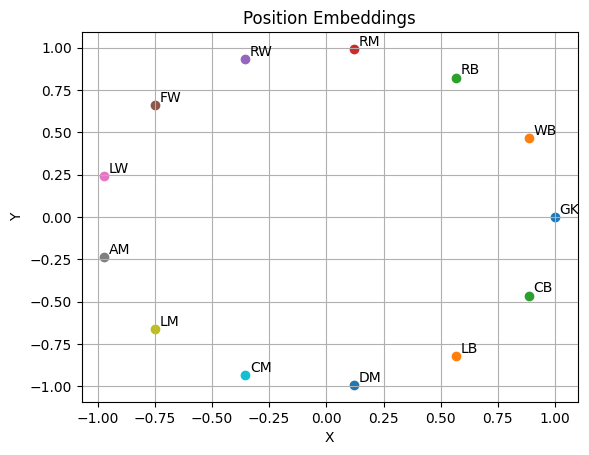

In [175]:
# Visualize position embeddings
import matplotlib.pyplot as plt
for pos, emb in position_embeddings.items():
    plt.scatter(emb[0], emb[1])
    plt.text(emb[0]+0.02, emb[1]+0.02, pos)
plt.title('Position Embeddings')
plt.xlabel('X')
plt.ylabel('Y')
plt.grid()
plt.show()

In [129]:
xdf[:5].apply(add_position_embedding, axis=1)

0      [0.5680647467311559, 0.8229838658936564]
1    [-0.35460488704253545, 0.9350162426854148]
2                                    [1.0, 0.0]
3     [-0.7485107481711013, -0.663122658240795]
4     [-0.6627733522342938, 0.5871659534864863]
dtype: object

In [169]:
# convert pos to 2D embedding
position_embeds = xdf.apply(add_position_embedding, axis=1)
xdf['pos_x'] = position_embeds.apply(lambda x: x[0])
xdf['pos_y'] = position_embeds.apply(lambda x: x[1])

In [170]:
xdf.shape

(9901, 31)

In [171]:
# string cols and numeric cols
string_cols = ['Pos', 'player_name', 'match_id', 'team']
numeric_cols = [col for col in xdf.columns if col not in string_cols]

In [172]:
# normalize numeric cols
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [148]:
xdf.drop(index=[10888], inplace=True)

In [173]:
xdf[numeric_cols] = scaler.fit_transform(xdf[numeric_cols])

In [ ]:
xdf[numeric_cols]

,Pos,Min,Gls,Ast,PK,PKatt,Sh,SoT,CrdY,CrdR,...,Cmp%,PrgP,Carries,PrgC,player_name,match_id,team,is_starting,pos_x,pos_y
0,RB,1.000000,0.00,0.000000,0.0,0.0,0.222222,0.2,0.0,0.0,...,0.826,0.200000,0.270492,0.000000,Ben White,Arsenal_Wolves_1_20240817_H,Arsenal,1.0,0.780848,0.914514
1,RW,0.876404,0.25,0.333333,0.0,0.0,0.555556,0.6,0.5,0.0,...,0.800,0.166667,0.204918,0.173913,Bukayo Saka,Arsenal_Wolves_1_20240817_H,Arsenal,1.0,0.312712,0.970942
2,GK,1.000000,0.00,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.757,0.000000,0.213115,0.000000,David Raya,Arsenal_Wolves_1_20240817_H,Arsenal,1.0,1.000000,0.500000
3,LM,0.932584,0.00,0.000000,0.0,0.0,0.111111,0.0,0.0,0.0,...,0.839,0.266667,0.163934,0.043478,Declan Rice,Arsenal_Wolves_1_20240817_H,Arsenal,1.0,0.112855,0.166003
4,"LW,RW",1.000000,0.00,0.000000,0.0,0.0,0.111111,0.0,0.0,0.0,...,0.783,0.066667,0.180328,0.173913,Gabriel Martinelli,Arsenal_Wolves_1_20240817_H,Arsenal,1.0,0.156356,0.795739
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9897,CB,1.000000,0.00,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.917,0.000000,0.237705,0.043478,Jean-Clair Todibo,Tottenham_West Ham_8_20241019_H,West Ham,1.0,0.941884,0.265932
9898,CB,0.213483,0.00,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.857,0.000000,0.040984,0.000000,Konstantinos Mavropanos,Tottenham_West Ham_8_20241019_H,West Ham,0.0,0.941884,0.265932
9899,CB,1.000000,0.00,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.964,0.066667,0.147541,0.000000,Max Kilman,Tottenham_West Ham_8_20241019_H,West Ham,1.0,0.941884,0.265932
9900,FW,0.662921,0.00,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.857,0.000000,0.057377,0.043478,Michail Antonio,Tottenham_West Ham_8_20241019_H,West Ham,1.0,0.112855,0.833997


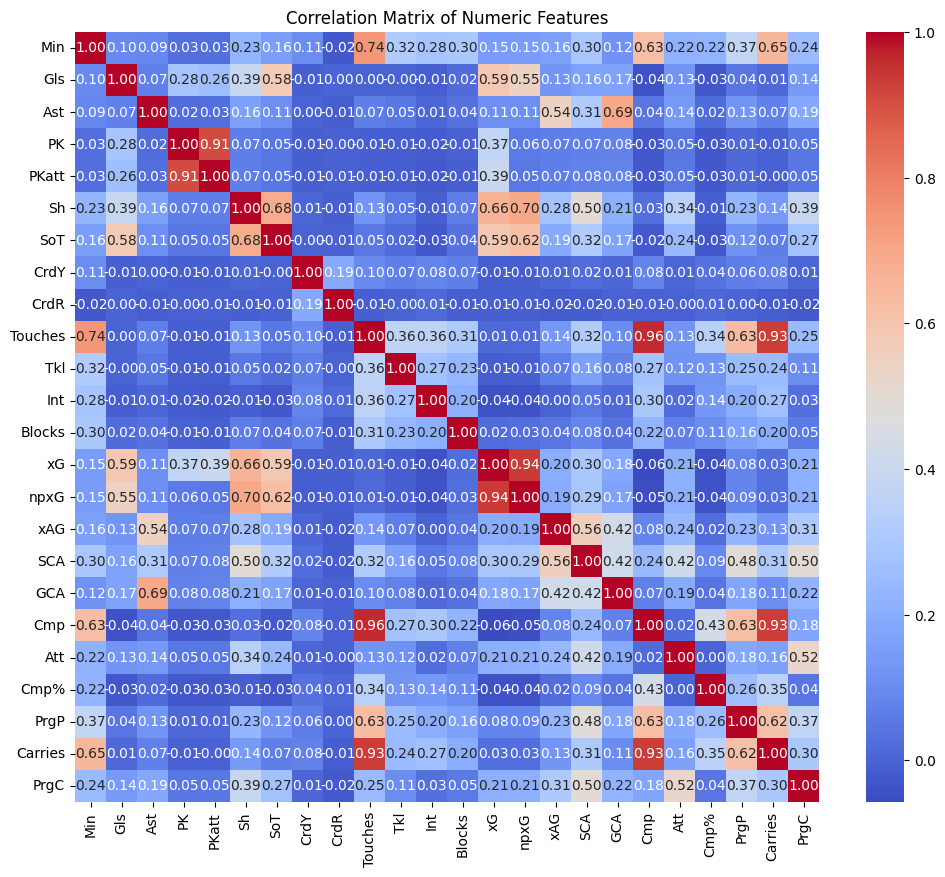

In [182]:
# see correlation matrix
import seaborn as sns
import matplotlib.pyplot as plt
numeric_cols.remove('is_starting')  # remove binary feature for correlation matrix
numeric_cols.remove('pos_x')
numeric_cols.remove('pos_y')
plt.figure(figsize=(12,10))
corr = xdf[numeric_cols].corr()
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix of Numeric Features')
plt.show()

In [184]:
# CMP, Carries and Touches are highly correlated
# xG, npxG are highly correlated
numeric_cols.remove('Cmp')
numeric_cols.remove('Carries')
numeric_cols.remove('npxG')

In [186]:
numeric_cols.remove('Min')

In [189]:
numeric_cols = numeric_cols+ ['Min']

In [ ]:
# the performance of above models is great because Gls and Asst are part of input features. We need to remove them for better generalization.
numeric_cols.remove('Gls')
numeric_cols.remove('Ast')
numeric_cols.remove('PK')
numeric_cols.remove('PKatt')

In [265]:
numeric_cols

['Sh',
 'SoT',
 'CrdY',
 'CrdR',
 'Touches',
 'Tkl',
 'Int',
 'Blocks',
 'xG',
 'xAG',
 'SCA',
 'GCA',
 'Att',
 'Cmp%',
 'PrgP',
 'PrgC',
 'Min']

In [192]:
xdf.head()

# add is home or away feature
def is_home(row):   
    if row['match_id'].endswith('_H'):
        return 1
    else:
        return 0

xdf['is_home'] = xdf.apply(is_home, axis=1)

In [193]:
xdf

,Pos,Min,Gls,Ast,PK,PKatt,Sh,SoT,CrdY,CrdR,...,PrgP,Carries,PrgC,player_name,match_id,team,is_starting,pos_x,pos_y,is_home
0,RB,1.000000,0.00,0.000000,0.0,0.0,0.222222,0.2,0.0,0.0,...,0.200000,0.270492,0.000000,Ben White,Arsenal_Wolves_1_20240817_H,Arsenal,1.0,0.780848,0.914514,1
1,RW,0.876404,0.25,0.333333,0.0,0.0,0.555556,0.6,0.5,0.0,...,0.166667,0.204918,0.173913,Bukayo Saka,Arsenal_Wolves_1_20240817_H,Arsenal,1.0,0.312712,0.970942,1
2,GK,1.000000,0.00,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.213115,0.000000,David Raya,Arsenal_Wolves_1_20240817_H,Arsenal,1.0,1.000000,0.500000,1
3,LM,0.932584,0.00,0.000000,0.0,0.0,0.111111,0.0,0.0,0.0,...,0.266667,0.163934,0.043478,Declan Rice,Arsenal_Wolves_1_20240817_H,Arsenal,1.0,0.112855,0.166003,1
4,"LW,RW",1.000000,0.00,0.000000,0.0,0.0,0.111111,0.0,0.0,0.0,...,0.066667,0.180328,0.173913,Gabriel Martinelli,Arsenal_Wolves_1_20240817_H,Arsenal,1.0,0.156356,0.795739,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9897,CB,1.000000,0.00,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.237705,0.043478,Jean-Clair Todibo,Tottenham_West Ham_8_20241019_H,West Ham,1.0,0.941884,0.265932,1
9898,CB,0.213483,0.00,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.040984,0.000000,Konstantinos Mavropanos,Tottenham_West Ham_8_20241019_H,West Ham,0.0,0.941884,0.265932,1
9899,CB,1.000000,0.00,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.066667,0.147541,0.000000,Max Kilman,Tottenham_West Ham_8_20241019_H,West Ham,1.0,0.941884,0.265932,1
9900,FW,0.662921,0.00,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.057377,0.043478,Michail Antonio,Tottenham_West Ham_8_20241019_H,West Ham,1.0,0.112855,0.833997,1


In [195]:
# we use all numeric cols plus pos_x and pos_y as features for model training
feature_cols = numeric_cols
other_cols = ['is_starting', 'pos_x', 'pos_y', 'is_home']

In [197]:
feature_cols, len(feature_cols)

(['Gls',
  'Ast',
  'PK',
  'PKatt',
  'Sh',
  'SoT',
  'CrdY',
  'CrdR',
  'Touches',
  'Tkl',
  'Int',
  'Blocks',
  'xG',
  'xAG',
  'SCA',
  'GCA',
  'Att',
  'Cmp%',
  'PrgP',
  'PrgC',
  'Min'],
 21)

In [ ]:
# model v1 
# create a model using torch
# importing libraries
import torch
import torch.nn as nn

# add one dense layer with relu activation to dims 8
# for all players in a match take a weighted average of output layer with Min as weights for each player in that match
# after averaging, concat the output with same for other team for same match
# finally pass through another dense layer to get final output i.e. predicted score difference

# Model without positional awareness


In [ ]:
feature_cols

In [258]:

class ScorePredictionModel(nn.Module):
    def __init__(self, feature_dim):
        super(ScorePredictionModel, self).__init__()
        self.player_fc = nn.Sequential(
            nn.Linear(feature_dim-1, 8),
            nn.ReLU()
        )
        self.final_fc = nn.Linear(16, 2)

    def apply_averaging(self, x):
        """
        x shape: (num_players, num_features + 1)
        where last column is 'Min' (minutes)
        """
        features = x[:, :-1]
        mins = x[:, -1].unsqueeze(1)  # shape: (num_players, 1)

        # pass features through player model
        out = self.player_fc(features)  # shape: (num_players, 8)

        # weighted average using minutes
        weighted_avg = (out * mins).sum(dim=0) / mins.sum()
        return weighted_avg  # shape: (8,)

    def concat_teams(self, team1_avg, team2_avg):
        return torch.cat((team1_avg, team2_avg), dim=-1)  # shape: (16,)

    def forward(self, team1_players, team2_players):
        team1_avg = self.apply_averaging(team1_players)
        team2_avg = self.apply_averaging(team2_players)
        combined = self.concat_teams(team1_avg, team2_avg).unsqueeze(0)  # shape: (1, 16)
        output = self.final_fc(combined)
        return output  # shape: (1, 1)

# Example usage
model = ScorePredictionModel(feature_dim=len(feature_cols))


# out = model(team1, team2)
# print(out)


In [208]:
print(model)

PlayerPerformanceModel(
  (player_fc): Sequential(
    (0): Linear(in_features=20, out_features=8, bias=True)
    (1): ReLU()
  )
  (final_fc): Linear(in_features=16, out_features=2, bias=True)
)


In [232]:
# count number of parameters
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
count_parameters(model)

202

In [203]:
# for each match, we need to prepare team1 and team2 player tensors from xdf
# for example, for match_id = 'Arsenal_Wolves_1_20240817_H'
match_id = 'Arsenal_Wolves_1_20240817_H'
team1_name = 'Arsenal'
team2_name = 'Wolves'

# Prepare player tensors for each team
team1_players = xdf[(xdf['match_id'] == match_id) & (xdf['team'] == team1_name)]
team2_players = xdf[(xdf['match_id'] == match_id) & (xdf['team'] == team2_name)]

In [204]:
team1_players.shape, team2_players.shape

((11, 32), (13, 32))

In [209]:
# forward features through model
team1_tensor = torch.tensor(team1_players[feature_cols].values, dtype=torch.float32)
team2_tensor = torch.tensor(team2_players[feature_cols].values, dtype=torch.float32)
model(team1_tensor, team2_tensor)

tensor([[-0.2544,  0.2154]], grad_fn=<AddmmBackward0>)

In [ ]:
# write a training loop for the model
# using MSE loss between predicted team 1 score and team 2 score

ydf['scoreline'] = ydf['scoreline'].apply(lambda x: list(map(int, x.replace('–','-').split('-'))))
ydf['team1_score'] = ydf['scoreline'].apply(lambda x: x[0])
ydf['team2_score'] = ydf['scoreline'].apply(lambda x: x[1])



In [213]:
ydf.head()

,match_id,team1,team2,result_team1,scoreline,team1_score,team2_score
0,Arsenal_Wolves_1_20240817_H,Arsenal,Wolves,W,"[2, 0]",2,0
1,Arsenal_Aston Villa_2_20240824_A,Arsenal,Aston Villa,W,"[2, 0]",2,0
2,Brentford_Southampton_3_20240831_H,Brentford,Southampton,W,"[3, 1]",3,1
3,Manchester Utd_Southampton_4_20240914_A,Manchester Utd,Southampton,W,"[3, 0]",3,0
4,Ipswich Town_Southampton_5_20240921_A,Ipswich Town,Southampton,D,"[1, 1]",1,1


In [214]:
# Training loop
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = nn.MSELoss()

# 80-20 train-test split
train_df = ydf.sample(frac=0.8, random_state=42)
test_df = ydf.drop(train_df.index)

for epoch in range(100):
    for i, row in train_df.iterrows():
        match_id = row['match_id']
        team1_name = row['team1']
        team2_name = row['team2']
        team1_players = xdf[(xdf['match_id'] == match_id) & (xdf['team'] == team1_name)]
        team2_players = xdf[(xdf['match_id'] == match_id) & (xdf['team'] == team2_name)]
        team1_tensor = torch.tensor(team1_players[feature_cols].values, dtype=torch.float32)
        team2_tensor = torch.tensor(team2_players[feature_cols].values, dtype=torch.float32)

        # Forward pass
        optimizer.zero_grad()
        output = model(team1_tensor, team2_tensor)
        loss = criterion(output, torch.tensor([[row['team1_score'], row['team2_score']]], dtype=torch.float32))
        loss.backward()
        optimizer.step()
    if (epoch+1) % 10 == 0:
        print(f"Epoch [{epoch+1}/100], Loss: {loss.item():.4f}")
        # Evaluate on test set
        with torch.no_grad():
            test_losses = []
            for j, test_row in test_df.iterrows():
                match_id = test_row['match_id']
                team1_name = test_row['team1']
                team2_name = test_row['team2']
                team1_players = xdf[(xdf['match_id'] == match_id) & (xdf['team'] == team1_name)]
                team2_players = xdf[(xdf['match_id'] == match_id) & (xdf['team'] == team2_name)]
                team1_tensor = torch.tensor(team1_players[feature_cols].values, dtype=torch.float32)
                team2_tensor = torch.tensor(team2_players[feature_cols].values, dtype=torch.float32)

                output = model(team1_tensor, team2_tensor)
                test_loss = criterion(output, torch.tensor([[test_row['team1_score'], test_row['team2_score']]], dtype=torch.float32))
                test_losses.append(test_loss.item())
            avg_test_loss = sum(test_losses) / len(test_losses)
            print(f"Test Loss: {avg_test_loss:.4f}")

Epoch [10/100], Loss: 0.5743
Test Loss: 0.6869
Epoch [20/100], Loss: 0.2011
Test Loss: 0.2922
Epoch [30/100], Loss: 0.1581
Test Loss: 0.2572
Epoch [40/100], Loss: 0.1374
Test Loss: 0.2472
Epoch [50/100], Loss: 0.1208
Test Loss: 0.2421
Epoch [60/100], Loss: 0.1073
Test Loss: 0.2396
Epoch [70/100], Loss: 0.0971
Test Loss: 0.2380
Epoch [80/100], Loss: 0.0892
Test Loss: 0.2372
Epoch [90/100], Loss: 0.0823
Test Loss: 0.2367
Epoch [100/100], Loss: 0.0781
Test Loss: 0.2368


In [218]:
# print model output and actual scoreline for all test matches with no_grad
test_results = []
for i, test_match in test_df.iterrows():
    match_id = test_match['match_id']
    team1_name = test_match['team1']
    team2_name = test_match['team2']
    team1_players = xdf[(xdf['match_id'] == match_id) & (xdf['team'] == team1_name)]
    team2_players = xdf[(xdf['match_id'] == match_id) & (xdf['team'] == team2_name)]
    team1_tensor = torch.tensor(team1_players[feature_cols].values, dtype=torch.float32)
    team2_tensor = torch.tensor(team2_players[feature_cols].values, dtype=torch.float32)
    with torch.no_grad():
        output = model(team1_tensor, team2_tensor)
    test_results.append((match_id,team1_name,team2_name, output.detach().numpy(), [test_match['team1_score'], test_match['team2_score']]))

In [219]:
pd.DataFrame(test_results, columns=['Match ID', 'Team 1', 'Team 2', 'Predicted', 'Actual']).to_csv('baseline_test_results.csv', index=False)

In [220]:
# save the model
torch.save(model.state_dict(), 'player_performance_model.pth')

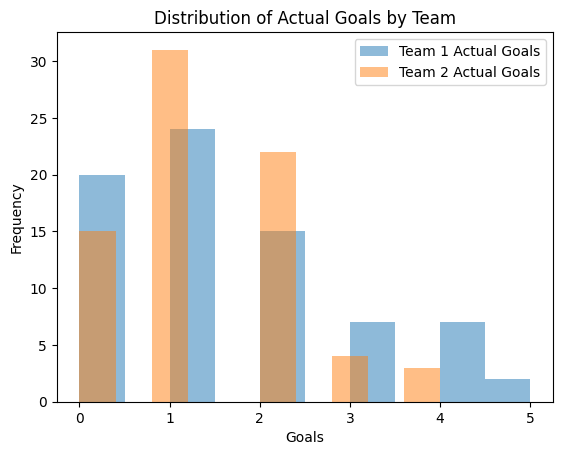

In [ ]:
# plot distribution of goals by team 1 and 2 to check for dataset imabalance
actual_goals = pd.DataFrame(test_results, columns=['Match ID', 'Team 1', 'Team 2', 'Predicted', 'Actual']).Actual
plt.hist([x[0] for x in actual_goals], alpha=0.5, label='Team 1 Actual Goals')
plt.hist([x[1] for x in actual_goals], alpha=0.5, label='Team 2 Actual Goals')
plt.xlabel('Goals')
plt.ylabel('Frequency')
plt.title('Distribution of Actual Goals by Team')
plt.legend()
plt.show()

In [229]:
# define a training loop function like the for loop above. Save the loss at the end of each epoch and test loss every 5 epochs.
# also check if test loss is decreasing or not increasing in which case either reduce learning rate or stop training

def train_model(model, train_df, test_df, xdf, feature_cols, num_epochs=100, patience=10, lr_schedule=None):

    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    criterion = nn.MSELoss()
    train_losses = []
    test_losses = []
    best_test_loss = float('inf')
    epochs_without_improvement = 0

    for epoch in range(num_epochs):
        epoch_loss = 0.0
        for i, row in train_df.iterrows():
            match_id = row['match_id']
            team1_name = row['team1']
            team2_name = row['team2']
            team1_players = xdf[(xdf['match_id'] == match_id) & (xdf['team'] == team1_name)]
            team2_players = xdf[(xdf['match_id'] == match_id) & (xdf['team'] == team2_name)]
            team1_tensor = torch.tensor(team1_players[feature_cols].values, dtype=torch.float32)
            team2_tensor = torch.tensor(team2_players[feature_cols].values, dtype=torch.float32)

            # Forward pass
            optimizer.zero_grad()
            output = model(team1_tensor, team2_tensor)
            loss = criterion(output, torch.tensor([[row['team1_score'], row['team2_score']]], dtype=torch.float32))
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()
        avg_epoch_loss = epoch_loss / len(train_df)
        train_losses.append(avg_epoch_loss)
            # Evaluate on test set
        with torch.no_grad():
            test_epoch_loss = 0.0
            for j, test_row in test_df.iterrows():
                match_id = test_row['match_id']
                team1_name = test_row['team1']
                team2_name = test_row['team2']
                team1_players = xdf[(xdf['match_id'] == match_id) & (xdf['team'] == team1_name)]
                team2_players = xdf[(xdf['match_id'] == match_id) & (xdf['team'] == team2_name)]
                team1_tensor = torch.tensor(team1_players[feature_cols].values, dtype=torch.float32)
                team2_tensor = torch.tensor(team2_players[feature_cols].values, dtype=torch.float32)

                output = model(team1_tensor, team2_tensor)
                test_loss = criterion(output, torch.tensor([[test_row['team1_score'], test_row['team2_score']]], dtype=torch.float32))
                test_epoch_loss += test_loss.item()
            avg_test_loss = test_epoch_loss / len(test_df)
            test_losses.append(avg_test_loss)
            print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {avg_epoch_loss:.4f}, Test Loss: {avg_test_loss:.4f}")
            # Early stopping check
            if lr_schedule:
                lr_schedule.step(avg_test_loss)

            if avg_test_loss < best_test_loss:
                best_test_loss = avg_test_loss
                epochs_without_improvement = 0
            else:
                epochs_without_improvement += 1
                if epochs_without_improvement >= patience:
                    print("Early stopping triggered.")
                    break
    return train_losses, test_losses

In [ ]:
from torch.optim.lr_scheduler import ReduceLROnPlateau
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=5,
    threshold=0.00001)

In [ ]:

class ScorePredictionModelV2(nn.Module):
    def __init__(self, feature_dim):
        super(ScorePredictionModelV2, self).__init__()
        self.player_fc = nn.Sequential(
            nn.Linear(feature_dim-1, 4),
            nn.ReLU()
        )
        self.final_fc = nn.Linear(8, 2)

    def apply_averaging(self, x):
        """
        x shape: (num_players, num_features + 1)
        where last column is 'Min' (minutes)
        """
        features = x[:, :-1]
        mins = x[:, -1].unsqueeze(1)  # shape: (num_players, 1)

        # pass features through player model
        out = self.player_fc(features)  # shape: (num_players, 8)

        # weighted average using minutes
        weighted_avg = (out * mins).sum(dim=0) / mins.sum()
        return weighted_avg  # shape: (8,)

    def concat_teams(self, team1_avg, team2_avg):
        return torch.cat((team1_avg, team2_avg), dim=-1)  # shape: (16,)

    def forward(self, team1_players, team2_players):
        team1_avg = self.apply_averaging(team1_players)
        team2_avg = self.apply_averaging(team2_players)
        combined = self.concat_teams(team1_avg, team2_avg).unsqueeze(0)  # shape: (1, 16)
        output = self.final_fc(combined)
        return output  # shape: (1, 1)

# Example usage
model = ScorePredictionModelV2(feature_dim=len(feature_cols))


In [235]:
count_parameters(model)

102

In [236]:
train_losses, test_losses = train_model(
    model,
    train_df,
    test_df,
    xdf,
    feature_cols,
    num_epochs=200,
    patience=10,
    lr_schedule=scheduler
)

Epoch [1/200], Train Loss: 2.5490, Test Loss: 1.6225
Epoch [2/200], Train Loss: 1.6133, Test Loss: 1.3336
Epoch [3/200], Train Loss: 1.4932, Test Loss: 1.3135
Epoch [4/200], Train Loss: 1.4694, Test Loss: 1.2894
Epoch [5/200], Train Loss: 1.4432, Test Loss: 1.2601
Epoch [6/200], Train Loss: 1.4061, Test Loss: 1.2159
Epoch [7/200], Train Loss: 1.3472, Test Loss: 1.1536
Epoch [8/200], Train Loss: 1.2704, Test Loss: 1.0784
Epoch [9/200], Train Loss: 1.1834, Test Loss: 0.9980
Epoch [10/200], Train Loss: 1.0930, Test Loss: 0.9174
Epoch [11/200], Train Loss: 1.0043, Test Loss: 0.8404
Epoch [12/200], Train Loss: 0.9205, Test Loss: 0.7692
Epoch [13/200], Train Loss: 0.8430, Test Loss: 0.7041
Epoch [14/200], Train Loss: 0.7722, Test Loss: 0.6456
Epoch [15/200], Train Loss: 0.7083, Test Loss: 0.5933
Epoch [16/200], Train Loss: 0.6509, Test Loss: 0.5468
Epoch [17/200], Train Loss: 0.5991, Test Loss: 0.5052
Epoch [18/200], Train Loss: 0.5526, Test Loss: 0.4685
Epoch [19/200], Train Loss: 0.5109, T

In [237]:
# check learning rate value
for i, param_group in enumerate(optimizer.param_groups):
    print(f"Learning Rate for group {i}: {param_group['lr']}")

Learning Rate for group 0: 0.0005


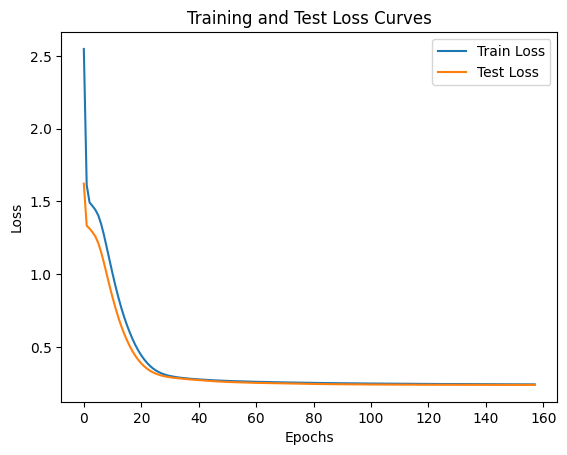

In [238]:
# print loss curves
plt.plot(train_losses, label='Train Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Test Loss Curves')
plt.legend()
plt.show()

In [239]:
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.1,
    patience=3,
    threshold=0.00001)

In [252]:
# lets try predicting Win/loss/draw


class WinPredictionModel(nn.Module):
    def __init__(self, feature_dim):
        super(WinPredictionModel, self).__init__()
        self.player_fc = nn.Sequential(
            nn.Linear(feature_dim-1, 8),
            nn.ReLU()
        )
        self.final_fc = nn.Linear(16, 4)
        self.softmax = nn.Softmax(dim=1)


    def apply_averaging(self, x):
        """
        x shape: (num_players, num_features + 1)
        where last column is 'Min' (minutes)
        """
        features = x[:, :-1]
        mins = x[:, -1].unsqueeze(1)  # shape: (num_players, 1)

        # pass features through player model
        out = self.player_fc(features)  # shape: (num_players, 8)

        # weighted average using minutes
        weighted_avg = (out * mins).sum(dim=0) / mins.sum()
        return weighted_avg  # shape: (8,)

    def concat_teams(self, team1_avg, team2_avg):
        return torch.cat((team1_avg, team2_avg), dim=-1)  # shape: (16,)

    def forward(self, team1_players, team2_players):
        team1_avg = self.apply_averaging(team1_players)
        team2_avg = self.apply_averaging(team2_players)
        combined = self.concat_teams(team1_avg, team2_avg).unsqueeze(0)
        output = self.final_fc(combined)
        return self.softmax(output)  # shape: (1, 4)

# Example usage
model = WinPredictionModel(feature_dim=len(feature_cols))


In [253]:
print(model), count_parameters(model)

WinPredictionModel(
  (player_fc): Sequential(
    (0): Linear(in_features=20, out_features=8, bias=True)
    (1): ReLU()
  )
  (final_fc): Linear(in_features=16, out_features=4, bias=True)
  (softmax): Softmax(dim=1)
)


(None, 236)

In [250]:
# update train function to use CrossEntropyLoss
# also convert result to class index: Win=0, Draw=1, Lose=2
# use accuracy as metric
def train_win_model(model, train_df, test_df, xdf, feature_cols, num_epochs=100, patience=10, lr_schedule=None):

    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    criterion = nn.CrossEntropyLoss()
    train_losses = []
    test_losses = []
    best_test_accuracy = 0.0
    epochs_without_improvement = 0

    for epoch in range(num_epochs):
        epoch_loss = 0.0
        for i, row in train_df.iterrows():
            match_id = row['match_id']
            team1_name = row['team1']
            team2_name = row['team2']
            team1_players = xdf[(xdf['match_id'] == match_id) & (xdf['team'] == team1_name)]
            team2_players = xdf[(xdf['match_id'] == match_id) & (xdf['team'] == team2_name)]
            team1_tensor = torch.tensor(team1_players[feature_cols].values, dtype=torch.float32)
            team2_tensor = torch.tensor(team2_players[feature_cols].values, dtype=torch.float32)
            # Convert result to class index: Win=0, Draw=1, Lose=2
            if row['result_team1'] == 'Win':
                target = torch.tensor([0], dtype=torch.long)
            elif row['result_team1'] == 'Draw':
                target = torch.tensor([1], dtype=torch.long)
            else:
                target = torch.tensor([2], dtype=torch.long)

            # Zero gradients
            optimizer.zero_grad()
            output = model(team1_tensor, team2_tensor)
            loss = criterion(output, target)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()
        avg_epoch_loss = epoch_loss / len(train_df)
        train_losses.append(avg_epoch_loss)
            # Evaluate on test set and calculate accuracy
        with torch.no_grad():
            test_epoch_loss = 0.0
            correct = 0
            total = 0
            for j, test_row in test_df.iterrows():
                match_id = test_row['match_id']
                team1_name = test_row['team1']
                team2_name = test_row['team2']
                team1_players = xdf[(xdf['match_id'] == match_id) & (xdf['team'] == team1_name)]
                team2_players = xdf[(xdf['match_id'] == match_id) & (xdf['team'] == team2_name)]
                team1_tensor = torch.tensor(team1_players[feature_cols].values, dtype=torch.float32)
                team2_tensor = torch.tensor(team2_players[feature_cols].values, dtype=torch.float32)

                output = model(team1_tensor, team2_tensor)
                if test_row['result_team1'] == 'Win':
                    target = torch.tensor([0], dtype=torch.long)
                elif test_row['result_team1'] == 'Draw':
                    target = torch.tensor([1], dtype=torch.long)
                else:
                    target = torch.tensor([2], dtype=torch.long)

                test_loss = criterion(output, target)
                test_epoch_loss += test_loss.item()

                _, predicted = torch.max(output.data, 1)
                total += target.size(0)
                correct += (predicted == target).sum().item()
            avg_test_loss = test_epoch_loss / len(test_df)
            test_losses.append(avg_test_loss)
            accuracy = 100 * correct / total
            print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {avg_epoch_loss:.4f}, Test Loss: {avg_test_loss:.4f}, Test Accuracy: {accuracy:.2f}%")
            # Early stopping check
            if lr_schedule:
                lr_schedule.step(avg_test_loss)
            if accuracy > best_test_accuracy:
                best_test_accuracy = accuracy   
                epochs_without_improvement = 0
            else:
                epochs_without_improvement += 1
                if epochs_without_improvement >= patience:
                    print("Early stopping triggered.")
                    break

    return train_losses, test_losses

            # Forward pass

In [254]:
train_losses, test_losses = train_win_model(
    model,
    train_df,
    test_df,
    xdf,
    feature_cols,
    num_epochs=200,
    patience=10,
    lr_schedule=scheduler
)

Epoch [1/200], Train Loss: 1.1985, Test Loss: 0.8207, Test Accuracy: 100.00%
Epoch [2/200], Train Loss: 0.7624, Test Loss: 0.7476, Test Accuracy: 100.00%
Epoch [3/200], Train Loss: 0.7458, Test Loss: 0.7448, Test Accuracy: 100.00%
Epoch [4/200], Train Loss: 0.7444, Test Loss: 0.7442, Test Accuracy: 100.00%
Epoch [5/200], Train Loss: 0.7440, Test Loss: 0.7439, Test Accuracy: 100.00%
Epoch [6/200], Train Loss: 0.7439, Test Loss: 0.7438, Test Accuracy: 100.00%
Epoch [7/200], Train Loss: 0.7438, Test Loss: 0.7438, Test Accuracy: 100.00%
Epoch [8/200], Train Loss: 0.7438, Test Loss: 0.7437, Test Accuracy: 100.00%
Epoch [9/200], Train Loss: 0.7437, Test Loss: 0.7437, Test Accuracy: 100.00%
Epoch [10/200], Train Loss: 0.7437, Test Loss: 0.7437, Test Accuracy: 100.00%
Epoch [11/200], Train Loss: 0.7437, Test Loss: 0.7437, Test Accuracy: 100.00%
Early stopping triggered.


In [256]:
feature_cols

['Gls',
 'Ast',
 'PK',
 'PKatt',
 'Sh',
 'SoT',
 'CrdY',
 'CrdR',
 'Touches',
 'Tkl',
 'Int',
 'Blocks',
 'xG',
 'xAG',
 'SCA',
 'GCA',
 'Att',
 'Cmp%',
 'PrgP',
 'PrgC',
 'Min']